# Aligning partially matched, serial, single-cell resolution breast cancer spatial transcriptomics data from Xenium

In this notebook, we take two single cell resolution spatial transcriptomics datasets of serial breast cancer sections profiled by the Xenium technology and align them to each other. See the bioRxiv preprint for more details about this data: https://www.biorxiv.org/content/10.1101/2022.10.06.510405v2 

We will use `STalign` to achieve this alignment. We will first load the relevant code libraries.

In [2]:
# https://jef.works/STalign/notebooks/xenium-heimage-alignment.html
# import dependencies ---------------------
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch

from STalign import STalign

# make plots bigger
plt.rcParams["figure.figsize"] = (12,10)
path = "/Users/estelladong/Desktop/raw_data_must"

We have already downloaded single cell spatial transcriptomics data from and placed the files in a folder called `xenium_data`: https://www.10xgenomics.com/products/xenium-in-situ/preview-dataset-human-breast

We can read in the cell information for the first dataset using `pandas` as `pd`.

In [3]:
# 1. Read data -------------------------
# Single cell data 1
# read in data
fname = path + '/Xenium/outs/cells.csv.gz'
df1 = pd.read_csv(fname)
print(df1.head())

   cell_id  x_centroid  y_centroid  transcript_counts  control_probe_counts   
0        1  847.259912  326.191365                 28                     1  \
1        2  826.341995  328.031830                 94                     0   
2        3  848.766919  331.743187                  9                     0   
3        4  824.228409  334.252643                 11                     0   
4        5  841.357538  332.242505                 48                     0   

   control_codeword_counts  total_counts   cell_area  nucleus_area  
0                        0            29   58.387031     26.642187  
1                        0            94  197.016719     42.130781  
2                        0             9   16.256250     12.688906  
3                        0            11   42.311406     10.069844  
4                        0            48  107.652500     37.479687  


For alignment with `STalign`, we only need the cell centroid information. So we can pull out this information. We can further visualize the cell centroids to get a sense of the variation in cell density that we will be relying on for our alignment by plotting using `matplotlib.pyplot` as `plt`. 

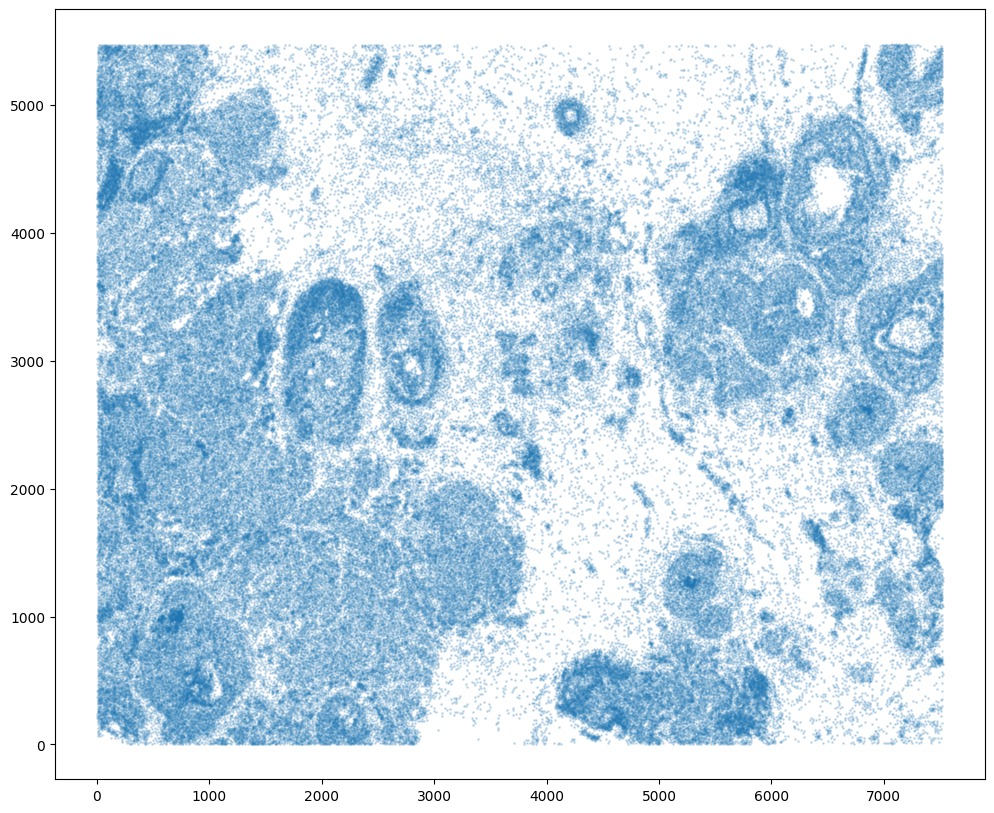

In [7]:
# get cell centroid coordinates
xI = np.array(df1['x_centroid'])
yI = np.array(df1['y_centroid'])

# plot
fig,ax = plt.subplots()
ax.scatter(xI,yI,s=1,alpha=0.2)

We will first use `STalign` to rasterize the single cell centroid positions into an image. Assuming the single-cell centroid coordinates are in microns, we will perform this rasterization at a 30 micron resolution. We can visualize the resulting rasterized image.

Note that points are plotting with the origin at bottom left while images are typically plotted with origin at top left so we've used `invert_yaxis()` to invert the yaxis for visualization consistency. 

0 of 167780
10000 of 167780
20000 of 167780
30000 of 167780
40000 of 167780
50000 of 167780
60000 of 167780
70000 of 167780
80000 of 167780
90000 of 167780
100000 of 167780
110000 of 167780
120000 of 167780
130000 of 167780
140000 of 167780
150000 of 167780
160000 of 167780
167779 of 167780


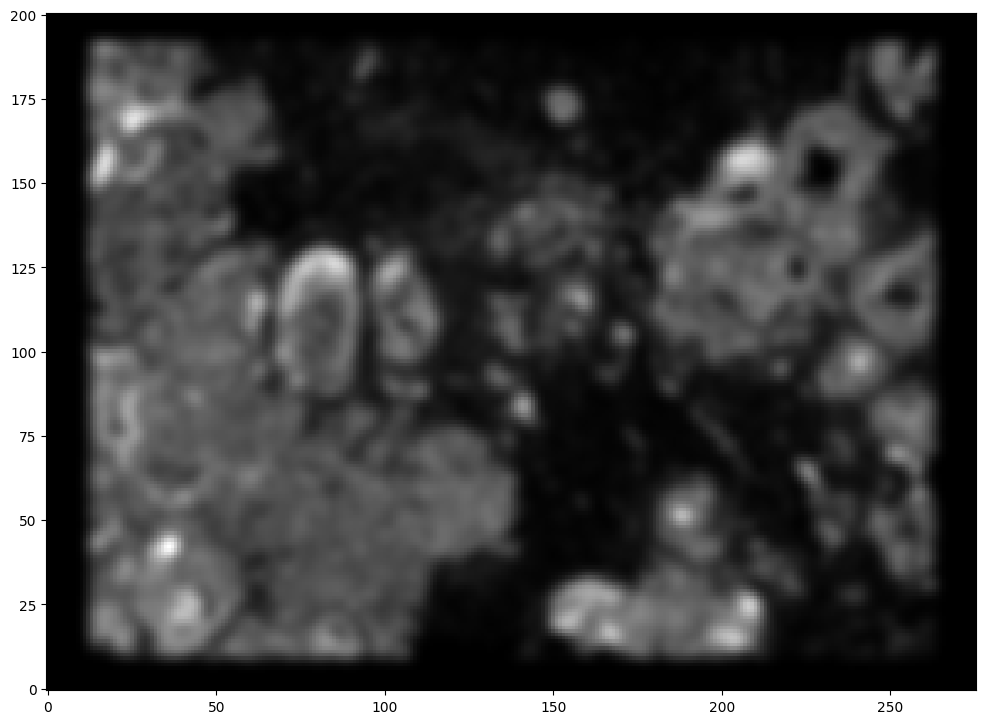

In [8]:
# rasterize at 30um resolution (assuming positions are in um units) and plot
XI,YI,I,fig = STalign.rasterize(xI,yI,dx=30)

# plot
ax = fig.axes[0]
ax.invert_yaxis()

Now, we can repeat this for the cell information from the second dataset.

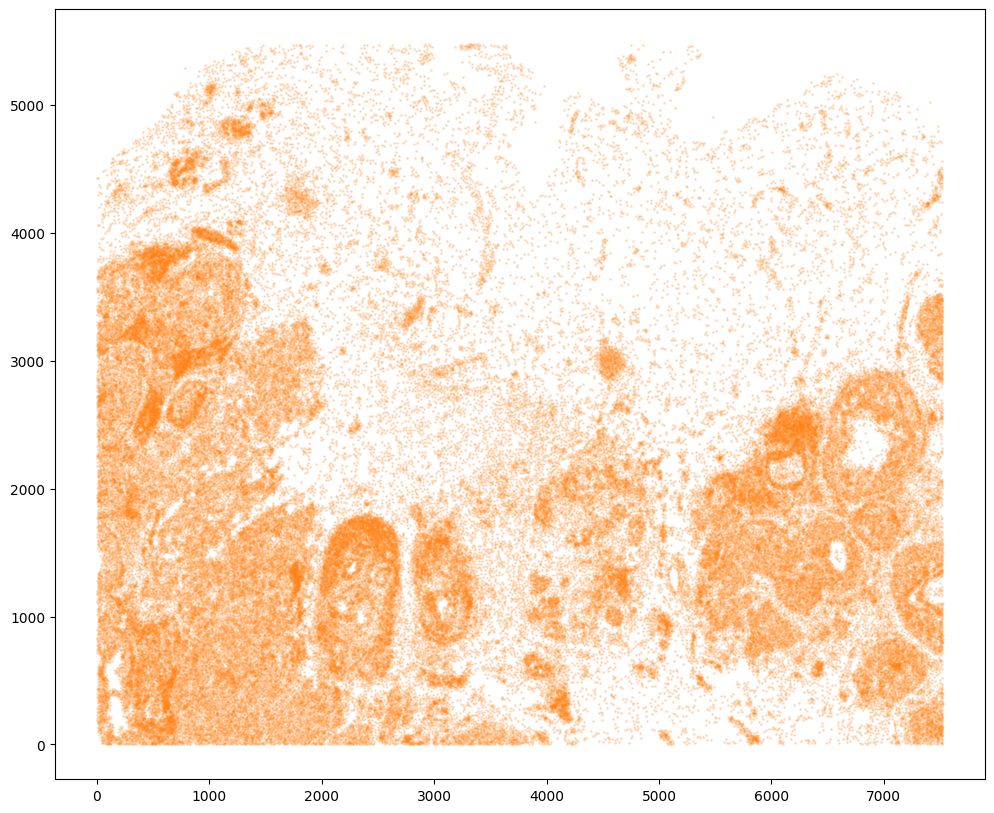

In [4]:
# 4. Repeat 1-3 for second dataset -----
# Single cell data 2
# read in data
fname = path + '/Xenium2/outs/cells.csv.gz'
df2 = pd.read_csv(fname)

# get cell centroids
xJ = np.array(df2['x_centroid'])
yJ = np.array(df2['y_centroid'])

# plot
fig,ax = plt.subplots()
ax.scatter(xJ,yJ,s=1,alpha=0.2,c='#ff7f0e')
plt.show()

Note that plotting the cell centroid positions from both datasets shows that alignment is still needed.

0 of 118752
10000 of 118752
20000 of 118752
30000 of 118752
40000 of 118752
50000 of 118752
60000 of 118752
70000 of 118752
80000 of 118752
90000 of 118752
100000 of 118752
110000 of 118752
118751 of 118752


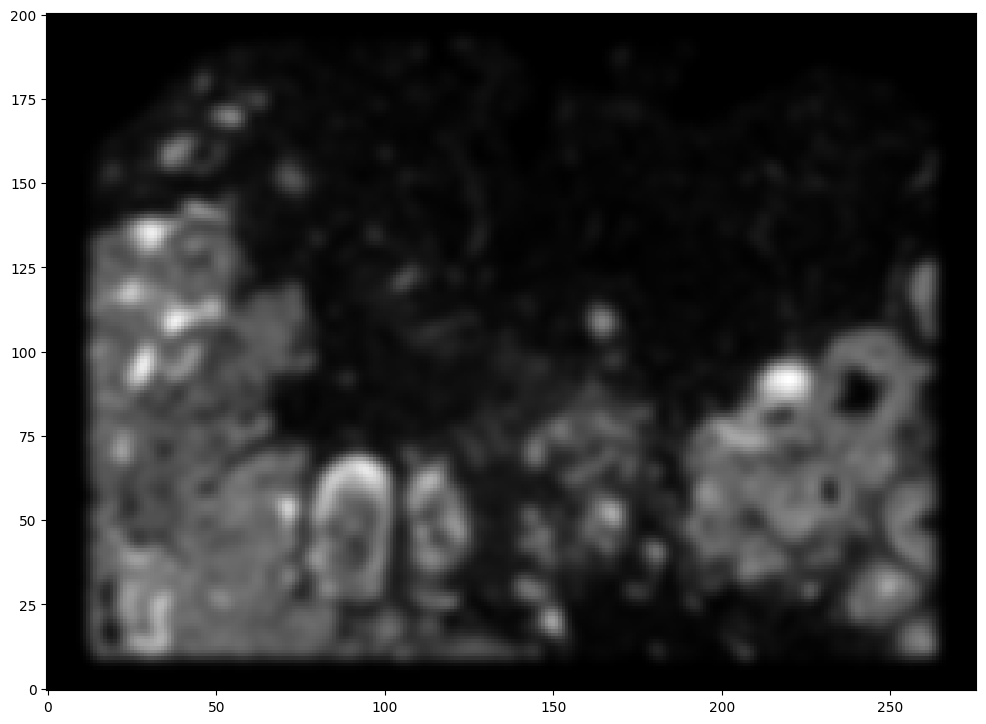

In [5]:
# rasterize and plot
XJ,YJ,J,fig = STalign.rasterize(xJ,yJ,dx=30)
ax = fig.axes[0]
ax.invert_yaxis()
plt.show()

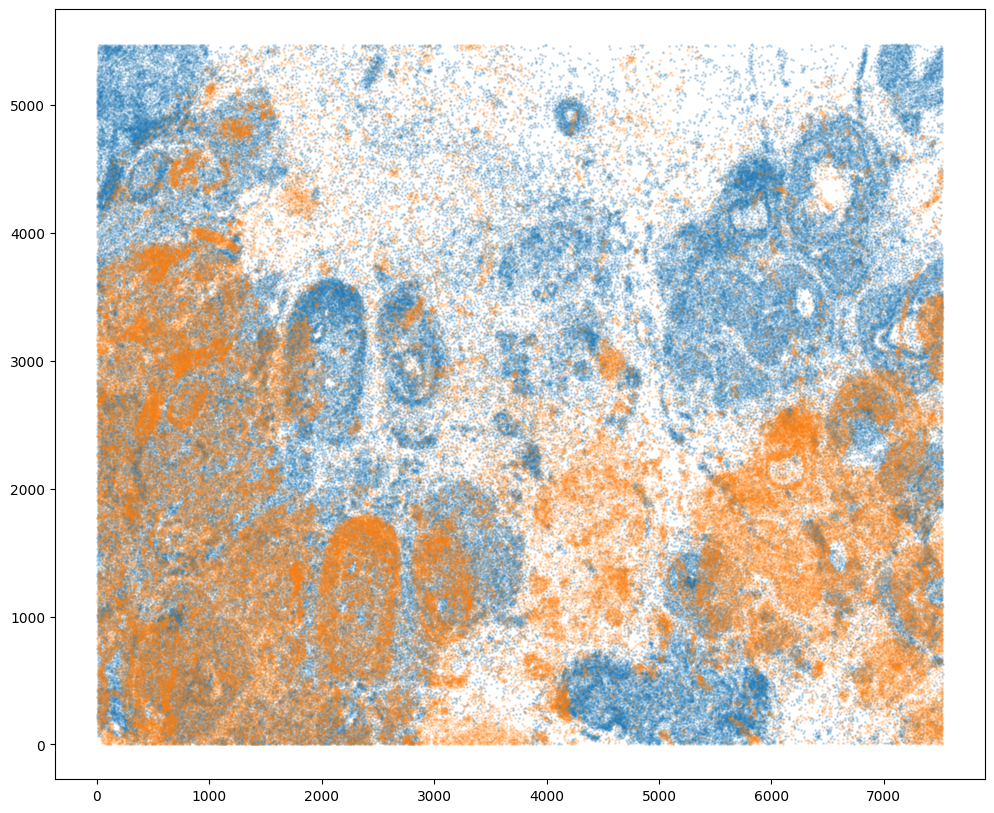

In [9]:
# 5. Plot overlay of unaligned ------------
# plot
fig,ax = plt.subplots()
ax.scatter(xI,yI,s=1,alpha=0.2)
ax.scatter(xJ,yJ,s=1,alpha=0.2)
plt.show()

In [10]:
# 8. Read landmarks selected from GUI ---------------------------
# read from file
pointsIlist = np.load(path + '/Xenium/outs/Xenium_Breast_Cancer_Rep1_curves.npy', allow_pickle=True).tolist()
print(pointsIlist)
# {'0': [(2131.810605092817, 3305.2189819028013)], '1': [(6547.254153479913, 4373.606078676995)], '2': [(4185.11705670572, 5007.960917386672)]}
pointsJlist = np.load(path + '/Xenium2/outs/Xenium_Breast_Cancer_Rep2_curves.npy', allow_pickle=True).tolist()
print(pointsJlist)
# {'A': [(2390.89730782228, 1485.9550435128795)], 'B': [(6831.381178790022, 2445.834075770944)], 'C': [(4544.365049757764, 3046.801817706428)]}

{'0': [(2131.810605092817, 3305.2189819028013)], '1': [(6547.254153479913, 4373.606078676995)], '2': [(4185.11705670572, 5007.960917386672)]}
{'A': [(2390.89730782228, 1485.9550435128795)], 'B': [(6831.381178790022, 2445.834075770944)], 'C': [(4544.365049757764, 3046.801817706428)]}


Note that these landmark points are read in as lists. We will want to convert them to a simple array for downstream usage. 

In [11]:
# convert to array
pointsI = []
pointsJ = []

# Jean's note: a bit odd to me that the points are stored as y,x
## instead of x,y but all downstream code uses this orientation
for i in pointsIlist.keys():
    pointsI.append([pointsIlist[i][0][1], pointsIlist[i][0][0]])
for i in pointsJlist.keys():
    pointsJ.append([pointsJlist[i][0][1], pointsJlist[i][0][0]])
    
pointsI = np.array(pointsI)
pointsJ = np.array(pointsJ)

In [12]:
# now arrays
print(pointsI)
print(pointsJ)

[[3305.2189819  2131.81060509]
 [4373.60607868 6547.25415348]
 [5007.96091739 4185.11705671]]
[[1485.95504351 2390.89730782]
 [2445.83407577 6831.38117879]
 [3046.80181771 4544.36504976]]


Alternatively, you can also just manually create an array of points.

But it will be good to double check that your landmark points look sensible by plotting them along with the rasterized image we created.

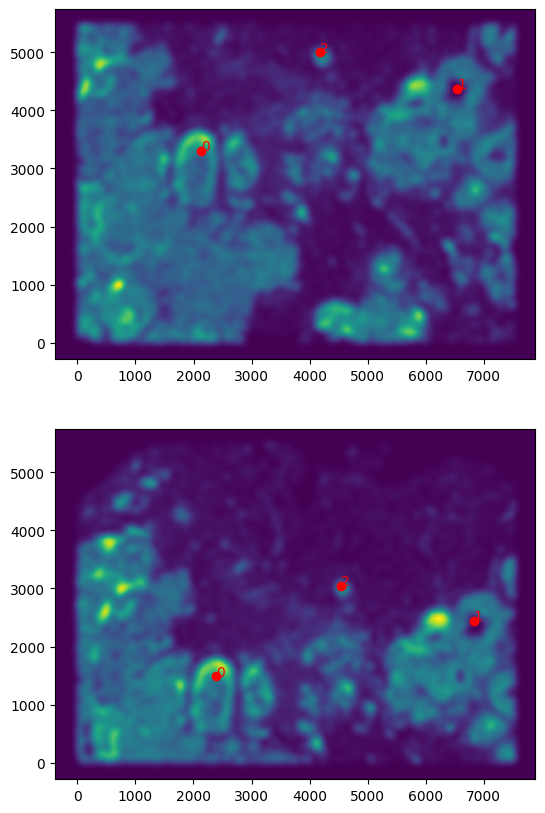

In [13]:
# get extent of images
extentI = STalign.extent_from_x((YI,XI))
extentJ = STalign.extent_from_x((YJ,XJ))

# plot rasterized images
fig,ax = plt.subplots(2,1)
ax[0].imshow((I.transpose(1,2,0).squeeze()), extent=extentI) # just want 201x276 matrix
ax[1].imshow((J.transpose(1,2,0).squeeze()), extent=extentJ) # just want 201x276 matrix
# with points
ax[0].scatter(pointsI[:,1], pointsI[:,0], c='red')
ax[1].scatter(pointsJ[:,1], pointsJ[:,0], c='red')
for i in range(pointsI.shape[0]):
    ax[0].text(pointsI[i,1],pointsI[i,0],f'{i}', c='red')
    ax[1].text(pointsJ[i,1],pointsJ[i,0],f'{i}', c='red')
ax[0].invert_yaxis()
ax[1].invert_yaxis()

We can now initialize a simple affine alignment from the landmark points. 

In [14]:
# set device for building tensors
if torch.cuda.is_available():
    torch.set_default_device('cuda:0')
else:
    torch.set_default_device('cpu')

In [15]:
# compute initial affine transformation from points
L,T = STalign.L_T_from_points(pointsI, pointsJ)
A = STalign.to_A(torch.tensor(L),torch.tensor(T))

We can show the results of the simple affine transformation.

/opt/homebrew/Caskroom/mambaforge/base/envs/newSTalign/lib/python3.11/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


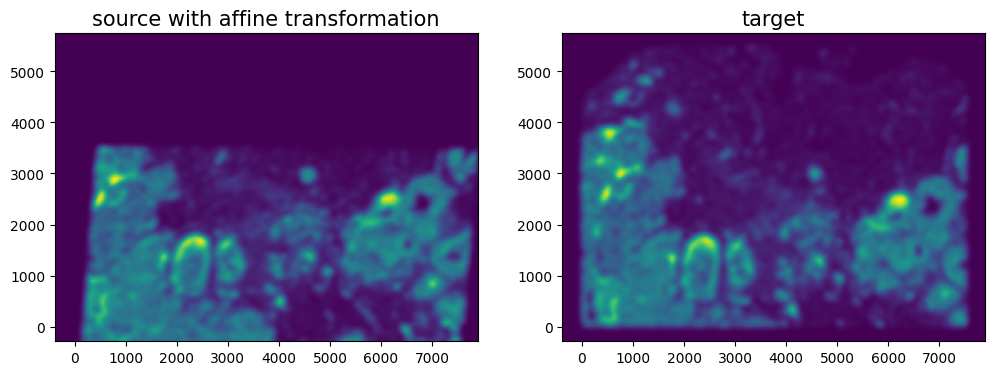

In [16]:
# compute initial affine transformation from points
AI = STalign.transform_image_source_with_A(A, [YI,XI], I, [YJ,XJ])

#switch tensor from cuda to cpu for plotting with numpy
if AI.is_cuda:
    AI = AI.cpu()

fig,ax = plt.subplots(1,2)
ax[0].imshow((AI.permute(1,2,0).squeeze()), extent=extentJ)
ax[1].imshow((J.transpose(1,2,0).squeeze()), extent=extentJ)

ax[0].set_title('source with affine transformation', fontsize=15)
ax[1].set_title('target', fontsize=15)

ax[0].invert_yaxis()
ax[1].invert_yaxis()

Depending on distortions in the tissue sample (as well as the accuracy of your landmark points), a simple affine alignment may not be sufficient to align the two single-cell spatial transcriptomics datasets. So we will need to perform non-linear local alignments via LDDMM. 

There are many parameters that can be tuned for performing this alignment. 

/opt/homebrew/Caskroom/mambaforge/base/envs/newSTalign/lib/python3.11/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/native/TensorShape.cpp:3484.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
/opt/homebrew/Caskroom/mambaforge/base/envs/newSTalign/lib/python3.11/site-packages/STalign/STalign.py:1301: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  axE[2].set_yscale('log')


CPU times: user 14.5 s, sys: 1.17 s, total: 15.7 s
Wall time: 13.4 s


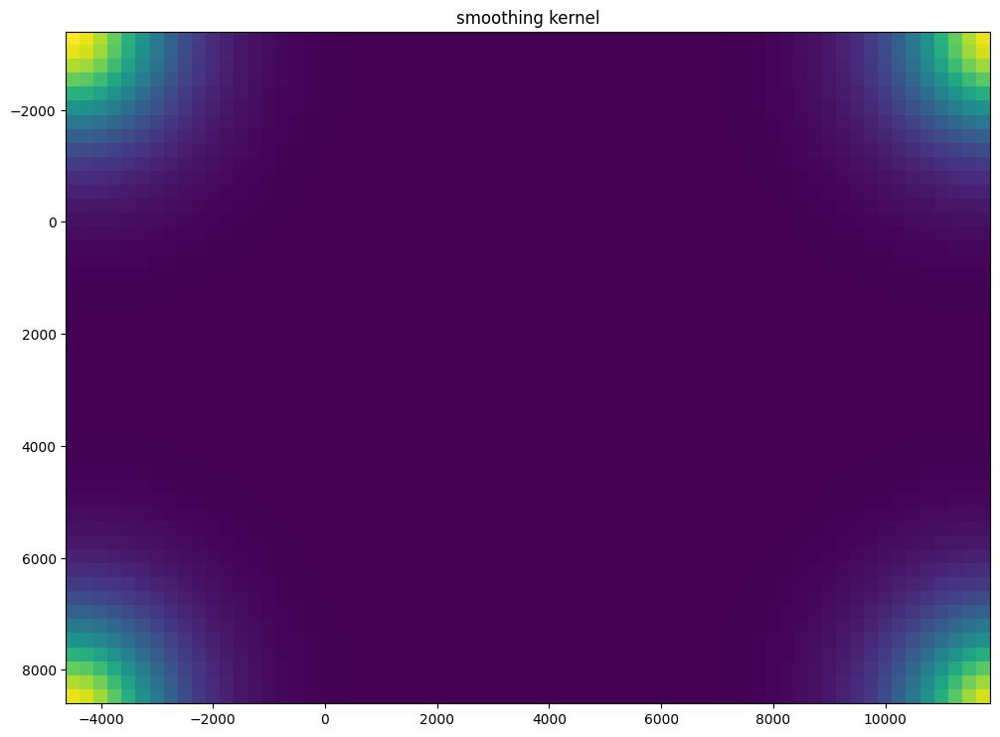

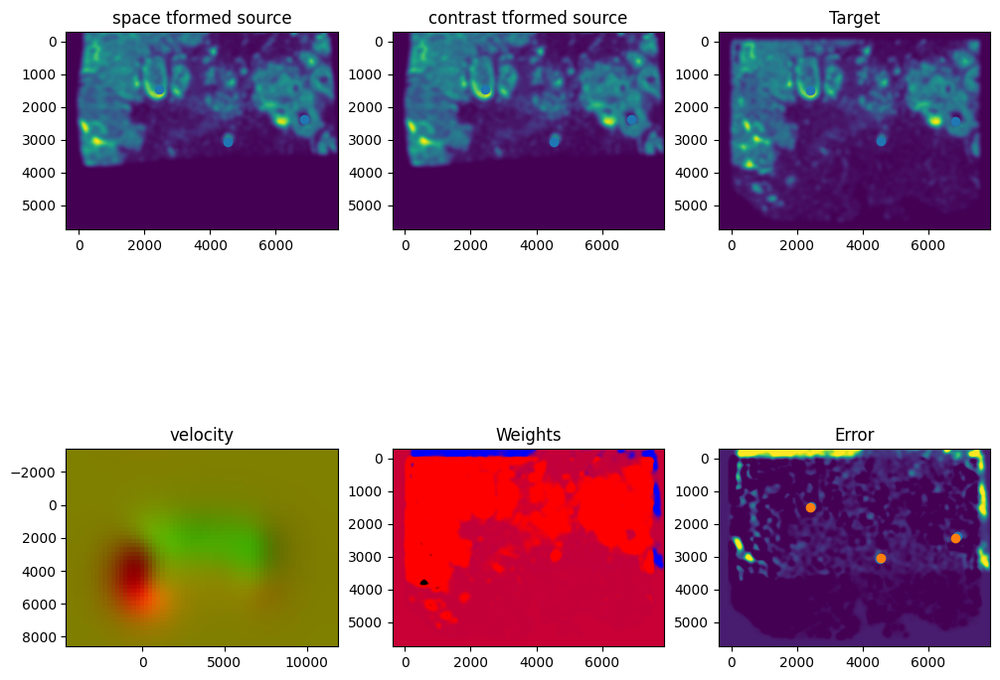

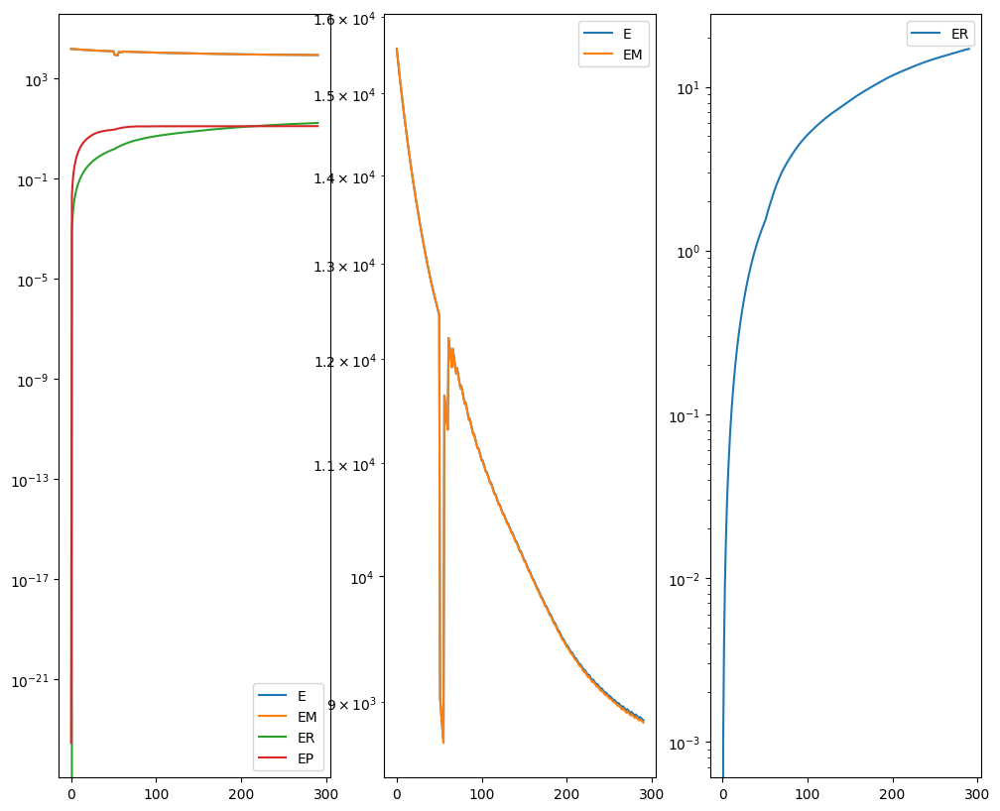

In [17]:
%%time

# run LDDMM
# specify device (default device for STalign.LDDMM is cpu)
if torch.cuda.is_available():
    device = 'cuda:0'
else:
    device = 'cpu'

# keep all other parameters default
params = {'L':L,'T':T,
          'niter':300,
          'pointsI':pointsI,
          'pointsJ':pointsJ,
          'device':device,
          'sigmaM':1.5,
          'sigmaB':1.0,
          'sigmaA':1.1,
          'epV': 100
          }

out = STalign.LDDMM([YI,XI],I,[YJ,XJ],J,**params)

In [18]:
# get necessary output variables
A = out['A']
v = out['v']
xv = out['xv']

Plots generated throughout the alignment can be used to give you a sense of whether the parameter choices are appropriate and whether your alignment is converging on a solution.

We can also evaluate the resulting alignment by applying the transformation to visualize how our source and target images were deformed to achieve the alignment. 

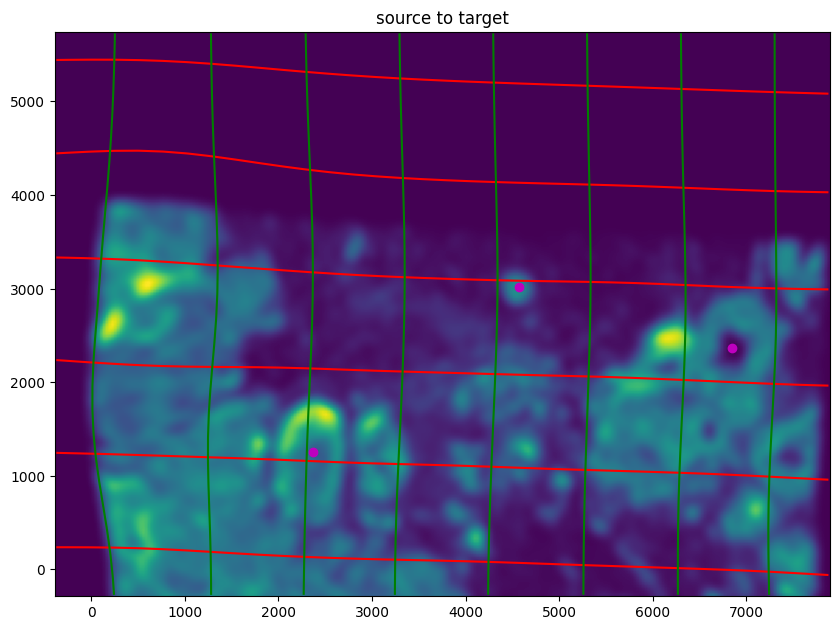

In [23]:
# apply transform (xe1 source to xe2 target, just for fun. Because we want to transform the coord of target xe2 in fact)
phii = STalign.build_transform(xv,v,A,XJ=[YJ,XJ],direction='b')
phiI = STalign.transform_image_source_to_target(xv,v,A,[YI,XI],I,[YJ,XJ])
phipointsI = STalign.transform_points_source_to_target(xv,v,A,pointsI)

#switch tensor from cuda to cpu for plotting with numpy
if phii.is_cuda:
    phii = phii.cpu()
if phiI.is_cuda:
    phiI = phiI.cpu()
if phipointsI.is_cuda:
    phipointsI = phipointsI.cpu()

# plot with grids
fig,ax = plt.subplots()
levels = np.arange(-100000,100000,1000)
ax.contour(XJ,YJ,phii[...,0],colors='r',linestyles='-',levels=levels)
ax.contour(XJ,YJ,phii[...,1],colors='g',linestyles='-',levels=levels)
ax.set_aspect('equal')
ax.set_title('source to target')
ax.imshow(phiI.permute(1,2,0)/torch.max(phiI),extent=extentJ)
ax.scatter(phipointsI[:,1].detach(),phipointsI[:,0].detach(),c="m")
ax.invert_yaxis()

Note that because of our use of LDDMM, the resulting transformation is invertible.

/opt/homebrew/Caskroom/mambaforge/base/envs/newSTalign/lib/python3.11/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


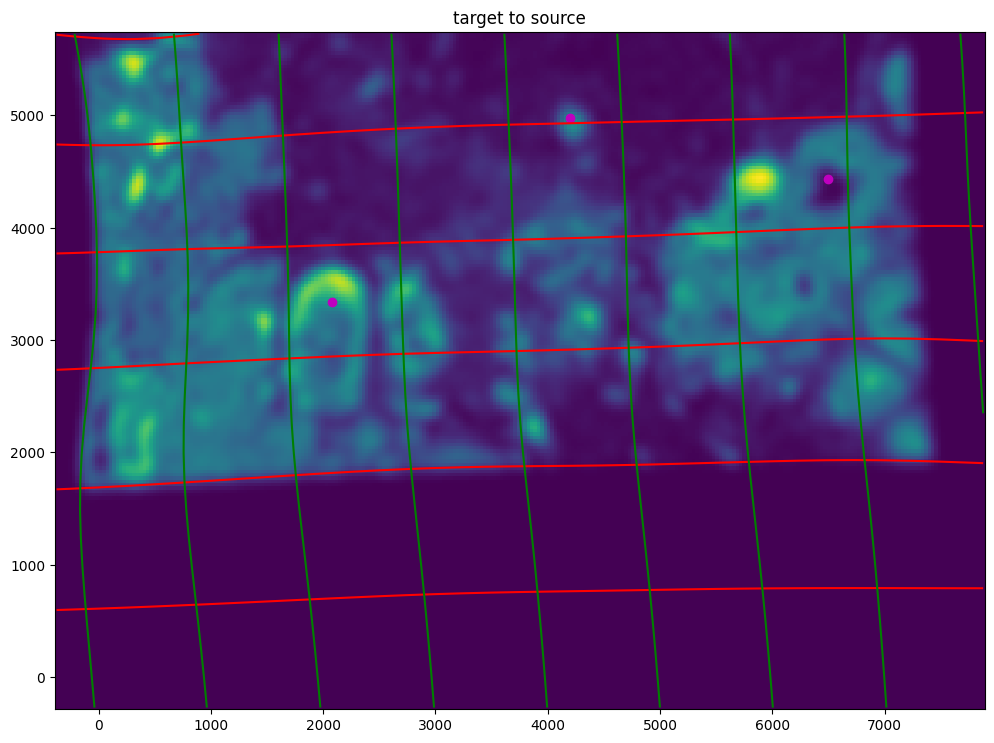

In [19]:
# transform is invertible (apply transform xe2 to xe1, target to source)
phi = STalign.build_transform(xv,v,A,XJ=[YI,XI],direction='f')
phiiJ = STalign.transform_image_target_to_source(xv,v,A,[YJ,XJ],J,[YI,XI])
phiipointsJ = STalign.transform_points_target_to_source(xv,v,A,pointsJ)

#switch tensor from cuda to cpu for plotting with numpy
if phi.is_cuda:
    phi = phi.cpu()
if phiiJ.is_cuda:
    phiiJ = phiiJ.cpu()
if phiipointsJ.is_cuda:
    phiipointsJ = phiipointsJ.cpu()

# plot with grids
fig,ax = plt.subplots()
levels = np.arange(-100000,100000,1000)
ax.contour(XI,YI,phi[...,0],colors='r',linestyles='-',levels=levels)
ax.contour(XI,YI,phi[...,1],colors='g',linestyles='-',levels=levels)
ax.set_aspect('equal')
ax.set_title('target to source')
ax.imshow(phiiJ.permute(1,2,0)/torch.max(phiiJ),extent=extentI)
ax.scatter(phiipointsJ[:,1].detach(),phiipointsJ[:,0].detach(),c="m")
ax.invert_yaxis()

Finally, we can apply our transform to the original sets of single cell centroid positions to achieve their new aligned positions.

In [20]:
# apply transform to original points of target to source
tpointsJ = STalign.transform_points_target_to_source(xv,v,A, np.stack([yJ, xJ], 1))

#switch tensor from cuda to cpu for plotting with numpy
if tpointsJ.is_cuda:
    tpointsJ = tpointsJ.cpu()

And we can visualize the results. On how xe2 is distorted. 

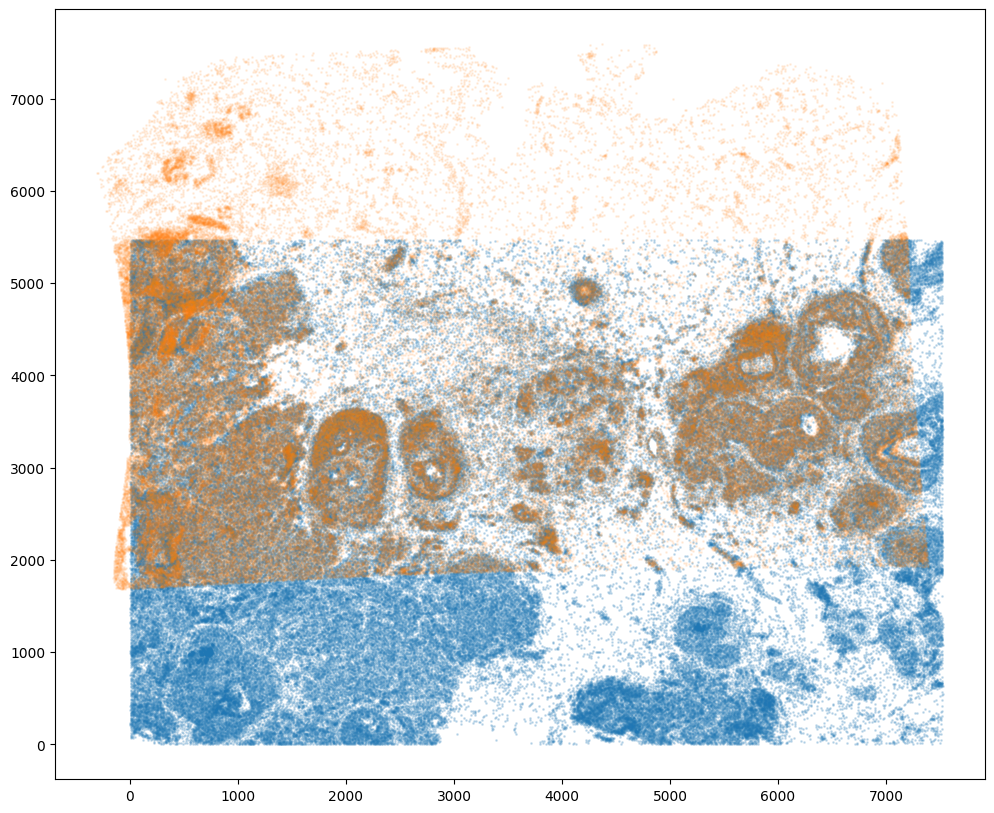

In [21]:
# plot results
fig,ax = plt.subplots()
ax.scatter(xI,yI,s=1,alpha=0.2) 
ax.scatter(tpointsJ[:,1],tpointsJ[:,0],s=1,alpha=0.1) # also needs to plot as y,x not x,y

And save the new aligned xe2 positions by appending to our original data using `numpy` with `np.hstack`

In [53]:
# save results by appending
# note results are in y,x coordinates
results = np.hstack((df2, tpointsJ.numpy()))
results = pd.DataFrame(results)

In [55]:
results.columns = df2.columns.append(pd.Index(["y_centroid_new", "x_centroid_new"]))
results.head()

,cell_id,x_centroid,y_centroid,transcript_counts,control_probe_counts,control_codeword_counts,total_counts,cell_area,nucleus_area,y_centroid_new,x_centroid_new
0,1.0,479.934467,869.789633,207.0,0.0,0.0,207.0,166.310469,44.343438,2631.626928,332.120084
1,2.0,481.256989,851.689365,147.0,0.0,0.0,147.0,218.420781,37.253906,2612.586423,331.217310
2,3.0,490.647247,855.816202,165.0,0.0,0.0,165.0,110.723125,42.717813,2617.404039,339.566082
3,4.0,491.177719,866.842908,186.0,0.0,0.0,186.0,181.482969,63.354219,2629.067142,341.226933
4,5.0,492.839691,842.511191,82.0,0.0,0.0,82.0,152.989375,17.204531,2603.470775,339.944237


We will finally create a compressed `.csv.gz` file to create `Xenium_Breast_Cancer_Rep2_STalign_to_Rep1.csv.gz`

In [57]:
results.to_csv(path + '/Xenium/outs/Xenium_Breast_Cancer_Rep2_STalign_to_Rep1.csv.gz',
               compression='gzip')

Note that the learned transform can be applied from source to target or target to source.

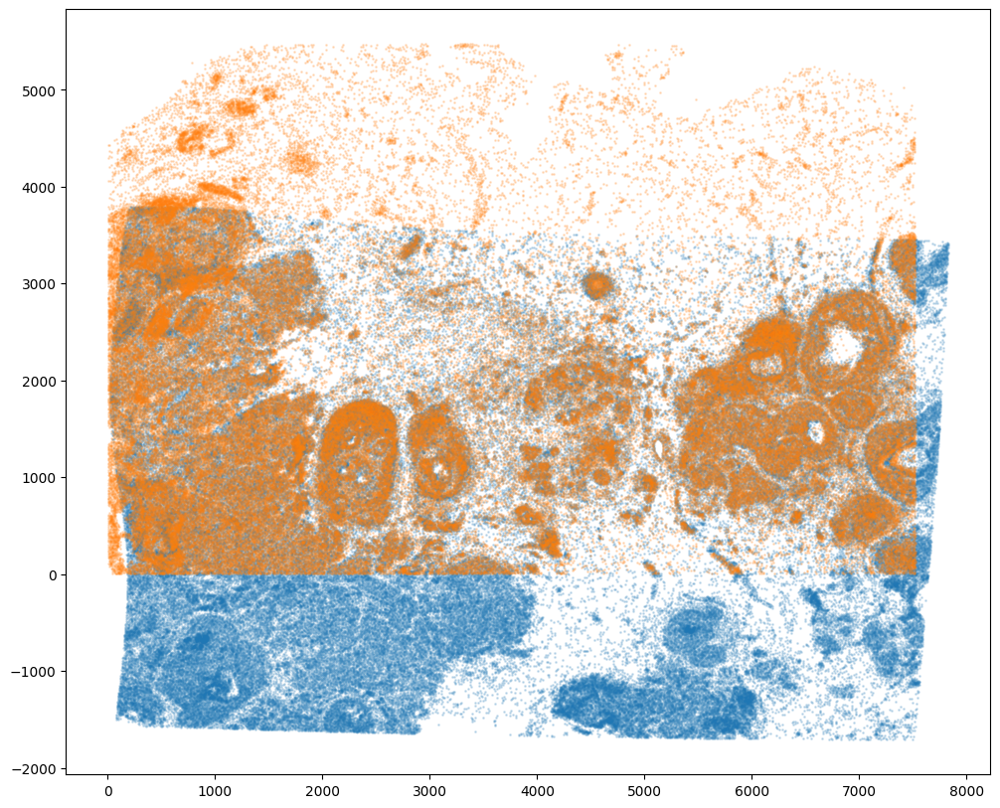

In [58]:
# apply transform to original points of source to target
tpointsI = STalign.transform_points_source_to_target(xv,v,A, np.stack([yI, xI], 1))

#switch tensor from cuda to cpu for plotting with numpy
if tpointsI.is_cuda:
    tpointsI = tpointsI.cpu()
    
# plot results
fig,ax = plt.subplots() 
ax.scatter(tpointsI[:,1],tpointsI[:,0],s=1,alpha=0.2) # also needs to plot as y,x not x,y
ax.scatter(xJ,yJ,s=1,alpha=0.2)

We can also use the matching weights to focus on the tissue region that is overlapping given the partially matching nature of this alignment.

In [59]:
# get the weights
WM = out['WM']
# compute weight values for transformed source points from target image pixel locations and weight 2D array (matching)
testM = STalign.interp([YI,XI],WM[None].float(),tpointsI[None].permute(-1,0,1).float())

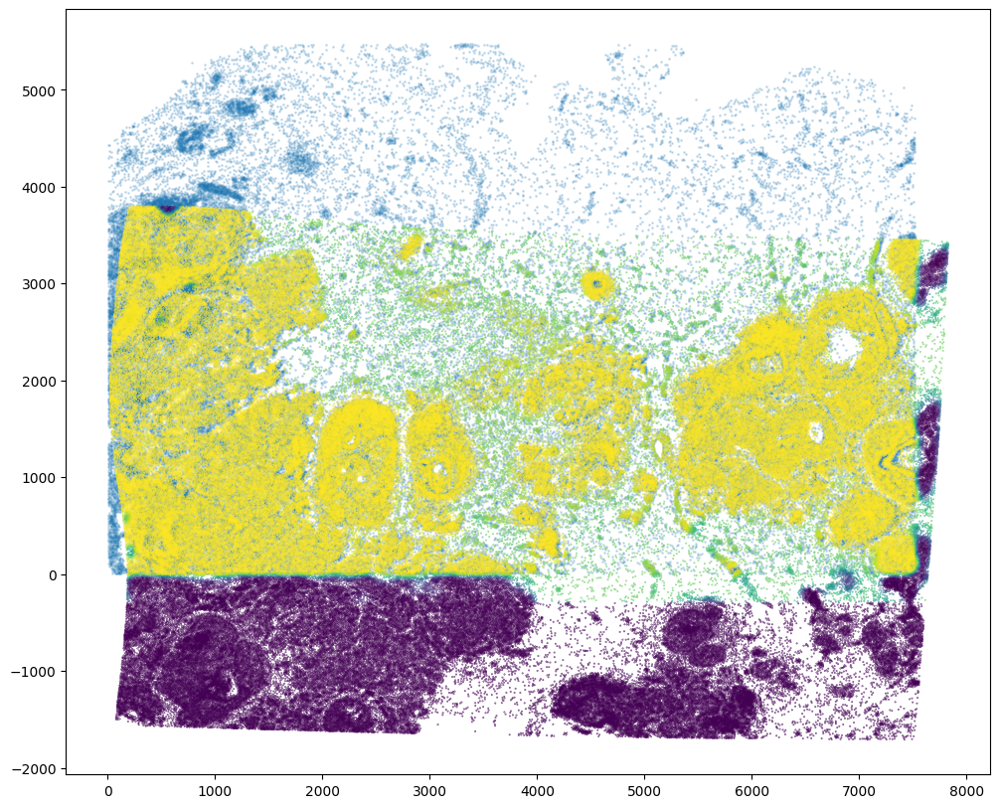

In [60]:
# note some cells were allocated into the artifact component (not matching and so not included, may need to tune sigmaA)
fig,ax = plt.subplots()
ax.scatter(xJ,yJ,s=1,alpha=0.2)
ax.scatter(tpointsI[:,1],tpointsI[:,0],c=testM[0,0],s=0.1,vmin=0,vmax=1, label='WM values')

(array([59339.,  1081.,   569.,   403.,   320.,   278.,   239.,   229.,
          208.,   195.,   238.,   250.,   357.,   449.,   727.,  5151.,
         2628.,  2713.,  3328., 89078.]),
 array([0.        , 0.04999994, 0.09999988, 0.14999983, 0.19999976,
        0.2499997 , 0.29999965, 0.34999958, 0.39999953, 0.44999945,
        0.4999994 , 0.54999936, 0.59999931, 0.6499992 , 0.69999915,
        0.74999911, 0.79999906, 0.84999901, 0.8999989 , 0.94999886,
        0.99999881]),
 <BarContainer object of 20 artists>)

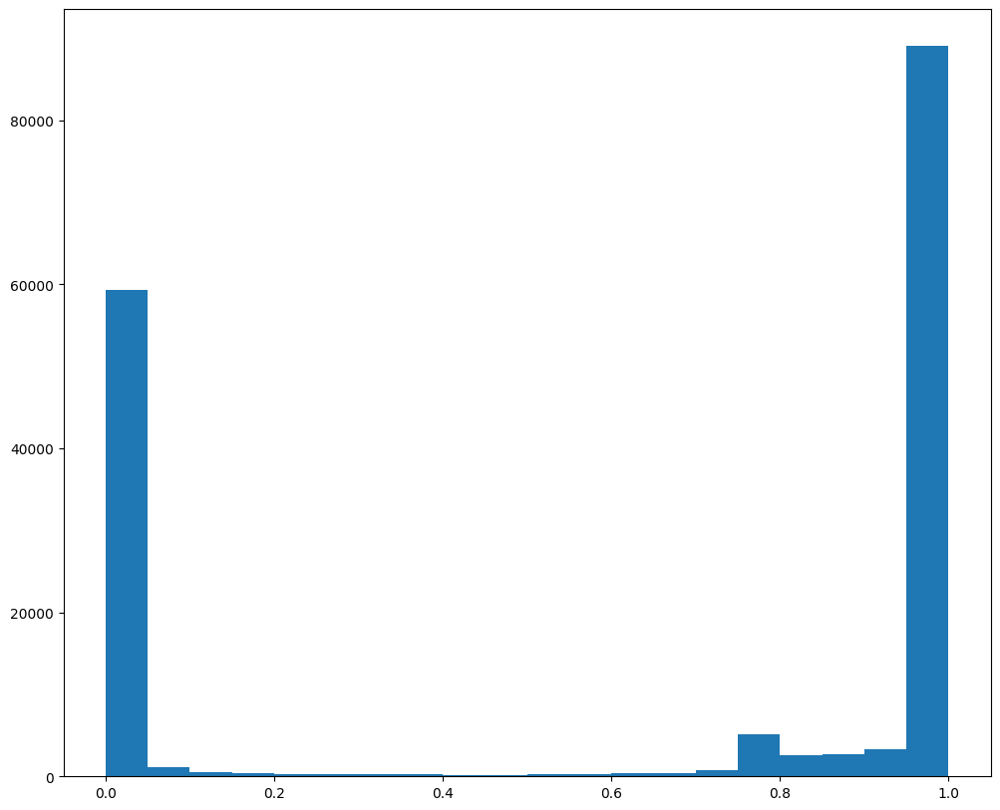

In [61]:
# visualize the distribution to identify reasonable cutoff
fig,ax = plt.subplots()
ax.hist(testM[0,0], bins = 20)

/var/folders/h5/vh79b3xn1rd5t9pv816mdzz40000gn/T/ipykernel_61256/1299893932.py:11: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(tpointsI_filtered[:,1],tpointsI_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')


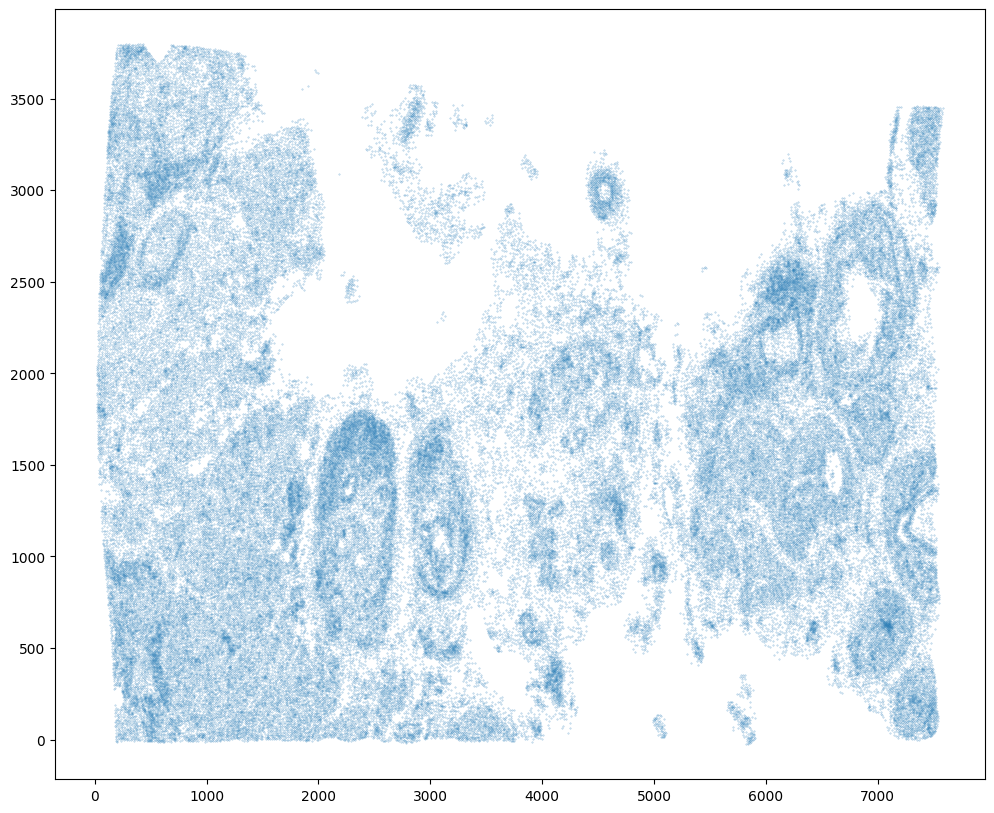

In [93]:
# set a threshold value
WMthresh = 0.8

# plot just the cells that pass filter (overlapping cells)
filtered = testM[0,0] > WMthresh
tpointsI_filtered = tpointsI[filtered,]

fig,ax = plt.subplots()
#ax.scatter(tpointsI[:,1],tpointsI[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='original')
#ax.scatter(xJ,yJ,s=1,alpha=0.2)
ax.scatter(tpointsI_filtered[:,1],tpointsI_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')

/var/folders/h6/yrnr80p14tdb_rr5pln6lg_00000gn/T/ipykernel_55448/1163503840.py:9: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(tpointsI[:,1],tpointsI[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='original')
/var/folders/h6/yrnr80p14tdb_rr5pln6lg_00000gn/T/ipykernel_55448/1163503840.py:11: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax.scatter(tpointsI_filtered[:,1],tpointsI_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')


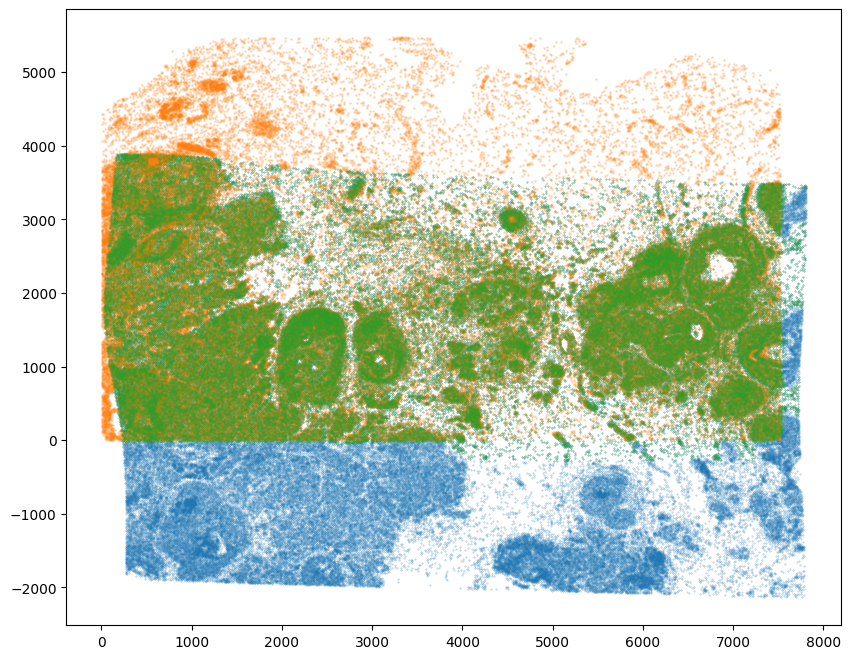

In [38]:
# choose less stringent threshold value
WMthresh = 0.5

# plot just the cells that pass filter (overlapping cells)
filtered = testM[0,0] > WMthresh
tpointsI_filtered = tpointsI[filtered,]

fig,ax = plt.subplots()
ax.scatter(tpointsI[:,1],tpointsI[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='original')
ax.scatter(xJ,yJ,s=1,alpha=0.2)
ax.scatter(tpointsI_filtered[:,1],tpointsI_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')

In this manner, we can restrict to just the cells that are matching for downstream analysis. 

In [76]:
# compute initial affine transformation from points
L,T = STalign.L_T_from_points(pointsJ, pointsI)
A = STalign.to_A(torch.tensor(L),torch.tensor(T))

/opt/homebrew/Caskroom/mambaforge/base/envs/newSTalign/lib/python3.11/site-packages/torch/utils/_device.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return func(*args, **kwargs)


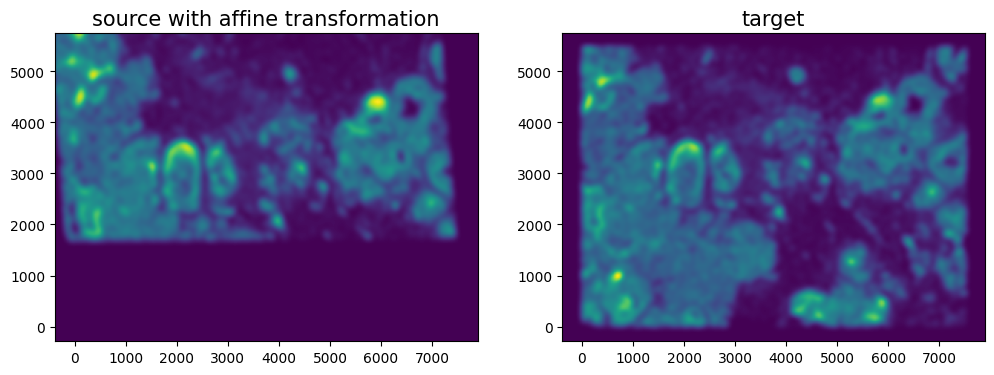

In [77]:
# compute initial affine transformation from points
AJ = STalign.transform_image_source_with_A(A, [YJ,XJ], J, [YI,XI])

#switch tensor from cuda to cpu for plotting with numpy
if AJ.is_cuda:
    AJ = AJ.cpu()

fig,ax = plt.subplots(1,2)
ax[0].imshow((AJ.permute(1,2,0).squeeze()), extent=extentI)
ax[1].imshow((I.transpose(1,2,0).squeeze()), extent=extentI)

ax[0].set_title('source with affine transformation', fontsize=15)
ax[1].set_title('target', fontsize=15)

ax[0].invert_yaxis()
ax[1].invert_yaxis()

/opt/homebrew/Caskroom/mambaforge/base/envs/newSTalign/lib/python3.11/site-packages/STalign/STalign.py:1301: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  axE[2].set_yscale('log')


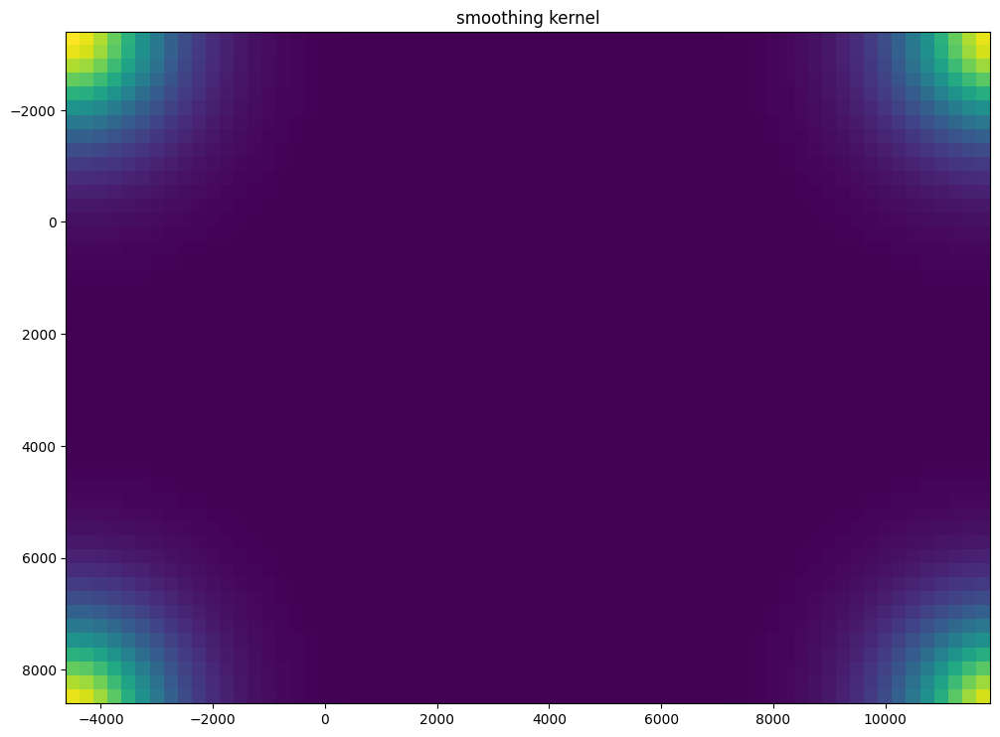

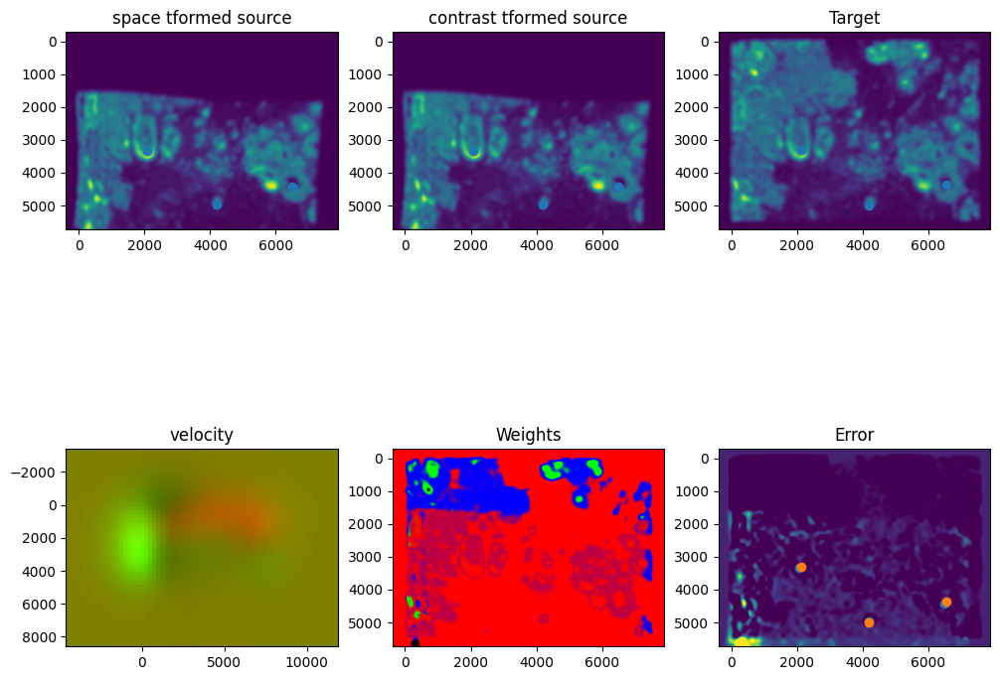

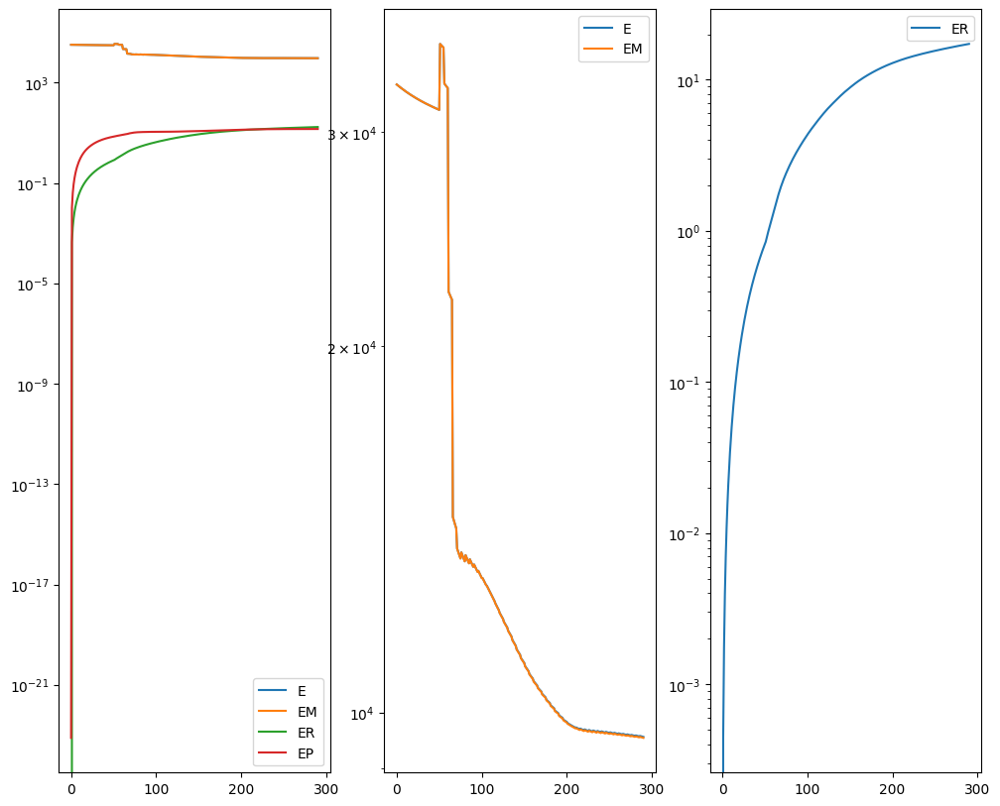

In [78]:
# keep all other parameters default
params = {'L':L,'T':T,
          'niter':300,
          'pointsI':pointsJ,
          'pointsJ':pointsI,
          'device':device,
          'sigmaM':1.5,
          'sigmaB':1.0,
          'sigmaA':1.1,
          'epV': 100
          }

out = STalign.LDDMM([YJ,XJ],J,[YI,XI],I,**params)

In [79]:
# Now try to get tpointJ_filtered ------------------
WM = out['WM']
# compute weight values for transformed source points from target image pixel locations and weight 2D array (matching)
testM_J = STalign.interp([YJ,XJ],WM[None].float(),tpointsJ[None].permute(-1,0,1).float())

(array([ 8672.,   296.,   273.,   269.,   246.,   238.,   254.,   300.,
          315.,   384.,   499.,   769.,  1113.,  2510., 19503., 20667.,
        11707., 10036.,  9619., 31082.]),
 array([0.        , 0.04999992, 0.09999985, 0.14999977, 0.19999969,
        0.24999961, 0.29999954, 0.34999946, 0.39999938, 0.4499993 ,
        0.49999923, 0.54999912, 0.59999907, 0.64999902, 0.69999892,
        0.74999881, 0.79999876, 0.84999871, 0.89999861, 0.9499985 ,
        0.99999845]),
 <BarContainer object of 20 artists>)

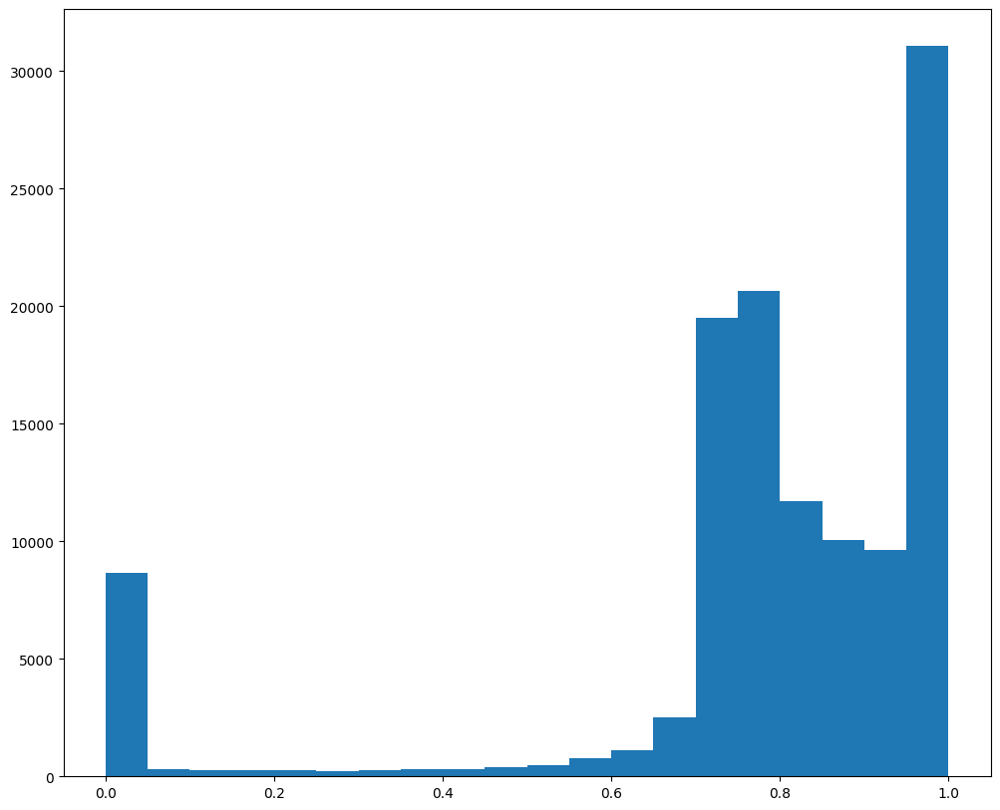

In [84]:
# visualize the distribution to identify reasonable cutoff
fig,ax = plt.subplots()
ax.hist(testM_J[0,0], bins = 20)

/var/folders/h5/vh79b3xn1rd5t9pv816mdzz40000gn/T/ipykernel_61256/88885519.py:9: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax[0].scatter(tpointsJ_filtered[:,1],tpointsJ_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')
/var/folders/h5/vh79b3xn1rd5t9pv816mdzz40000gn/T/ipykernel_61256/88885519.py:10: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax[1].scatter(tpointsI_filtered[:,1],tpointsI_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')


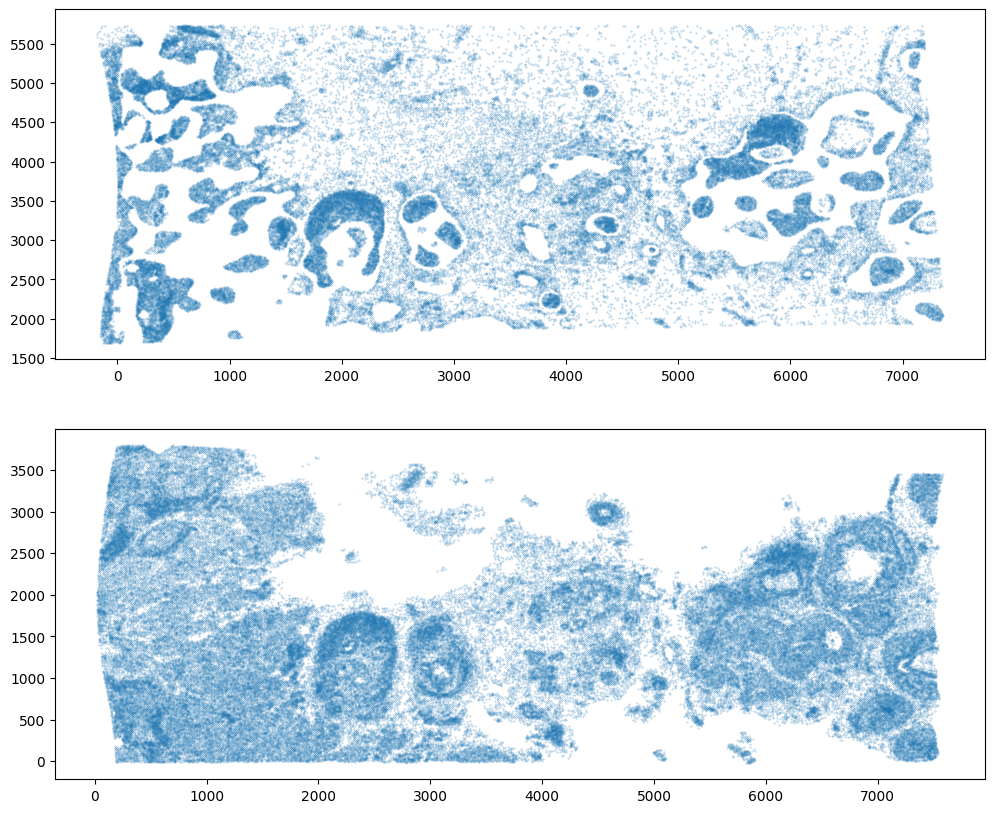

In [98]:
# set a threshold value
WMthresh_J = 0.8

# plot just the cells that pass filter (overlapping cells)
filtered_J = testM_J[0,0] > WMthresh_J
tpointsJ_filtered = tpointsJ[filtered_J,]

fig,ax = plt.subplots(2, 1)
ax[0].scatter(tpointsJ_filtered[:,1],tpointsJ_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')
ax[1].scatter(tpointsI_filtered[:,1],tpointsI_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')

/var/folders/h5/vh79b3xn1rd5t9pv816mdzz40000gn/T/ipykernel_61256/3798595665.py:2: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax[0].scatter(tpointsJ_filtered[:,1],tpointsJ_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')
/var/folders/h5/vh79b3xn1rd5t9pv816mdzz40000gn/T/ipykernel_61256/3798595665.py:3: UserWarning: No data for colormapping provided via 'c'. Parameters 'vmin', 'vmax' will be ignored
  ax[1].scatter(tpointsI_filtered[:,1],tpointsI_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')


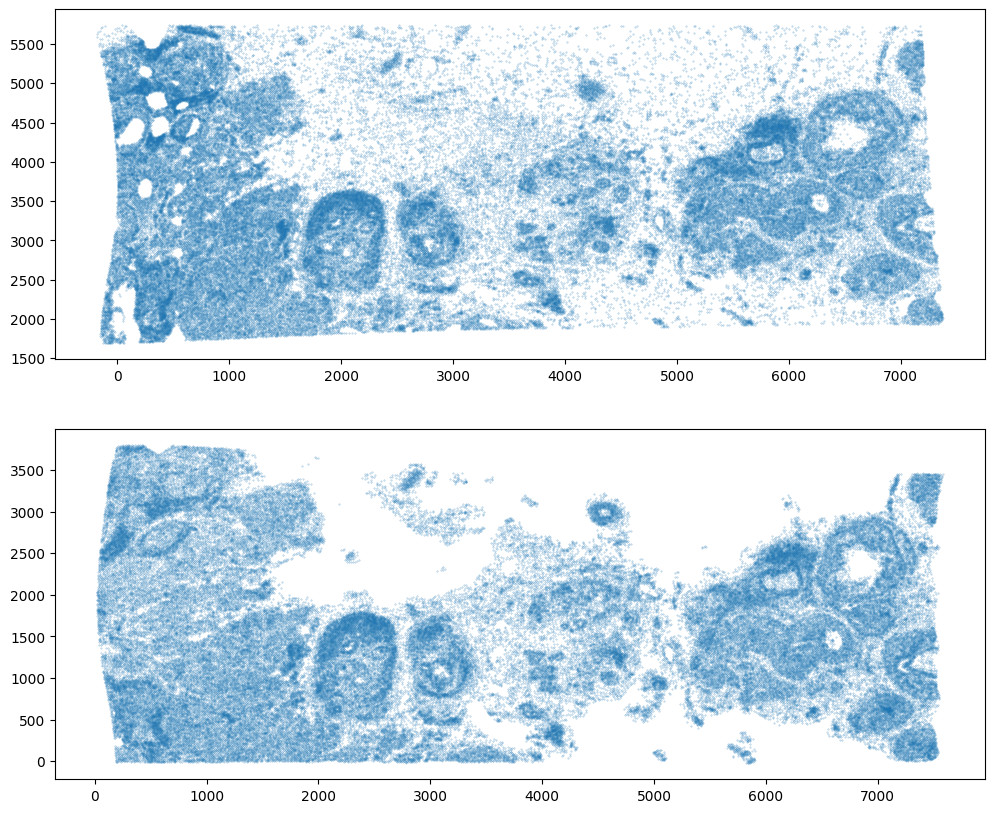

In [97]:
# set a threshold value
WMthresh_J = 0.6

# plot just the cells that pass filter (overlapping cells)
filtered_J = testM_J[0,0] > WMthresh_J
tpointsJ_filtered = tpointsJ[filtered_J,]

fig,ax = plt.subplots(2, 1)
ax[0].scatter(tpointsJ_filtered[:,1],tpointsJ_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')
ax[1].scatter(tpointsI_filtered[:,1],tpointsI_filtered[:,0],s=0.1,alpha=0.5,vmin=0,vmax=1, label='filtered')

In [100]:
tpointsJ_filtered.shape

torch.Size([62443, 2])

In [101]:
tpointsI_filtered.shape

torch.Size([97747, 2])

In [102]:
tpointsJ.shape

torch.Size([118752, 2])

In [103]:
tpointsI.shape

torch.Size([167780, 2])

In [ ]:
# save the weights and filtering information (xe2 to xe1)
# 21. save 'weight' values to 'results' --------------------------------
results['WM_values'] = testM[0,0]
# add a flag indicating filter out cell or not
results['filtered'] = testM[0,0] > WMthresh

results.to_csv(path + '/Xenium/outs/Xenium_Breast_Cancer_Rep2_STalign_to_Rep1_weights.csv.gz',
               compression='gzip')

# # save the weights and filtering information (xe2 to xe1)
# # 21. save 'weight' values to 'results' --------------------------------
# results_J['WM_values'] = testM_J[0,0]
# # add a flag indicating filter out cell or not
# results_J['filtered'] = testM_J[0,0] > WMthresh_J